In [1]:
# define packages
using Plots, NLSolvers, DifferentialEquations, Plots.PlotMeasures, LaTeXStrings, Roots, NLsolve

In [2]:
# define constants
const V0 = 3. # the value has to be taken from the figure 1
const N = 400 # number of x points
const L_real_turing = 0.05 # total length also non-dimensional point (l/re)
const L_real_waves = 0.015
const c = 1.82;
const Vr = 3;
const dt = 0.05;   # adimensional time step
const muP0_val = 2.5; # external stimulus

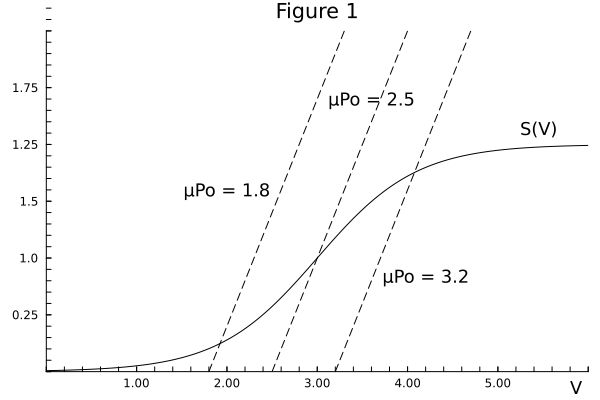

Solution for V0[1]: 1.9235627757679878
Solution for V0[1]: 2.9999999913758333
Solution for V0[1]: 4.07643722760594


In [3]:
######## FIGURE 1 #########

V=0:0.01:6   #range of membrane potentials
S=1 ./(1 .+exp.(-c.*(V.-Vr)))  #sigmoid function

a_e=6 
a_i=5
brok_li_1=1.8
brok_li_2=2.5
brok_li_3=3.2
y_1= V.*(1.5)./1.5.+brok_li_1  #equation of the first broken line
y_2= V.*(1.5)./1.5.+brok_li_2  #equation of the second broken line
y_3= V.*(1.5)./1.5.+brok_li_3  #equation of the third broken line

# Plot Figure 1
p=plot( y_1, V, linestyle=:dash, color=:black, xlims=(0, 6), ylims=(0, 1.5), grid=false, legend=false,title="Figure 1") 

plot!(y_2, V, linestyle=:dash, color=:black)
plot!(y_3, V, linestyle=:dash, color=:black)
plot!(V, S, color=:black)

plot!(
    xticks=(
        vcat(0:1:6, 0:0.2:6),                
        vcat(["", "1.00", "2.00", "3.00", "4.00", "5.00", " "], repeat("", 30)) 
    ),
    yticks=(
        vcat(0:0.25:2, 0:0.05:2), 
        vcat(["", "0.25", "1.0", "1.5", "1.25", "1.75", " "], repeat("", 30))  
    ),
    
)

annotate!(5.8, -0.07, text("V", :left, 12))
annotate!(2, 0.8, text("µPo = 1.8", :black, 12))  
annotate!(3.6, 1.2, text("µPo = 2.5", :black, 12))
annotate!(4.2, 0.42, text("µPo = 3.2", :black, 12))
annotate!(5.45, 1.07, text("S(V)", :black, 12))

display(p)

# Define the non linear equation as a function
function equation(V)
    V[1] - (a_e - a_i) * (1 / (1 + exp(-c * (V[1] - Vr)))) -µ_Po
end


# Solve 
µ_Po=1.8
result = nlsolve(equation, [0.5])  
println("Solution for V0[1]: ", result.zero[1])

µ_Po=2.5
result = nlsolve(equation, [0.5])
println("Solution for V0[1]: ", result.zero[1])

µ_Po=3.2
result = nlsolve(equation, [0.5])
println("Solution for V0[1]: ", result.zero[1])

   

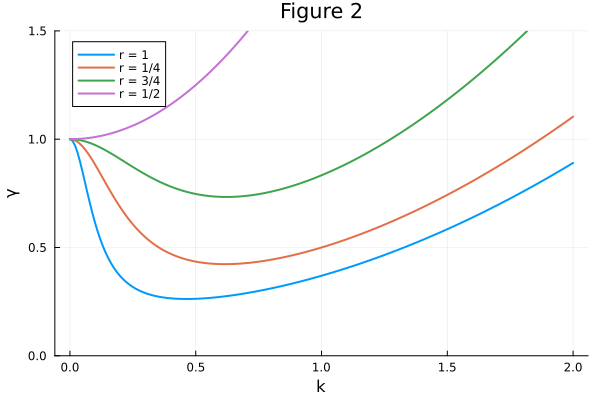

In [4]:
######## FIGURE 2 #########

γ_c(k, r, ae, ai) = (r^2 + (1 + r^2) * k^2 + k^4) / ((ae - ai) * r^2 + (ae - ai * r^2) * k^2)

r_range = [1/4,1/2, 3/4, 1]
k = 0:0.01:2.0
ae = 6
ai = 5

plot(k, [γ_c.(k, r, ae, ai) for r in r_range], ylim = (0,1.5), label = ["r = 1" "r = 1/4" "r = 3/4" "r = 1/2"], xlabel = 'k', ylabel = 'γ', lw = 2,
legend = :topleft, title="Figure 2")

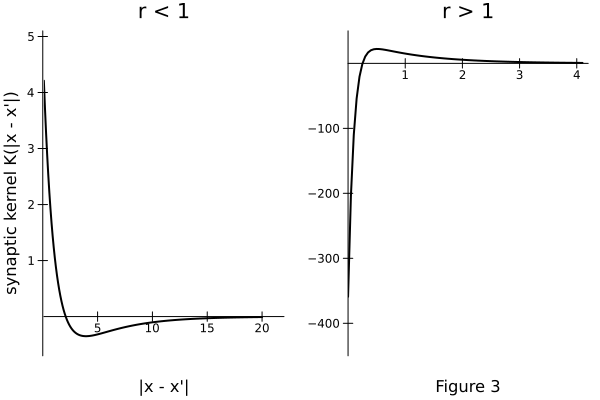

In [5]:
######## FIGURE 3 #########

# Define a function for the synaptic kernel K(|x - x'|)
# r = re/ri
function synaptic_kernel(x, ae, ai, r)
    ex = exp.(-x)            
    return ae .* ex - ai .* r .* (ex .^ r)  
end

# r < 1
x1 = 0.:0.1:20.               # Define x range
ae1, ai1, r1 = 6., 5., 0.25   # Parameters
K1 = synaptic_kernel(x1, ae1, ai1, r1)
plot1 = plot(
    x1, K1,
    xlabel="|x - x'|", ylabel="synaptic kernel K(|x - x'|)",
    title="r < 1", color=:black, lw=2, grid=false, legend=false,
    xlims=(0.1, 22), ylims=(-0.7, 5.1), framestyle=:origin
)

# r > 1
x2 = 0.:0.05:4.1              # Define x range
ae2, ai2, r2 = 41., 40., 10.  # Parameters
K2 = synaptic_kernel(x2, ae2, ai2, r2)
plot2 = plot(
    x2, K2, legend=false, xlabel="Figure 3",
    title="r > 1", color=:black, lw=2, grid=false,
    xlims=(0, 4.2), ylims=(-450, 50), framestyle=:origin
)

plot(plot1, plot2, layout=(1, 2))

In [6]:
######## Main Code - Figure 7, 8, 9, 10, 11 ########

# define functions

function sigmoid(V_mat)  # compute the sigmoid function for each value of the input matrix. The output has the same size of the input.
    return 1 ./ (1 .+ exp.(-c .* (V_mat.-Vr)))
end

const G0 = 2 .* sigmoid(V0*ones(1,N+1)) # precompute the value of G when the time is negative

function G(V,nt,n,du,v) # compute the G. V is the whole matrix, nt is the current iteration and n is the index of the spatial-temporal delay
    nx = 0:N  # vector of the index in the x axis
    timedelayed = nt*dt .- (n.*du./v)   # delay in adimensional seconds
    ntdelayed = Int64(round(timedelayed / dt))   # delay in terms of indexes
    if ntdelayed < 1
        return G0    # if the time is negative return the precomputed value
    else
        G1 = sigmoid(V[ntdelayed,mod1.((nx.-n.+1),N+1)])  # compute the G for the two different (opposite) delays
        G2 = sigmoid(V[ntdelayed,((nx.+n).%(N+1).+1)])    # circular shift with the indexes
        return permutedims(G1.+G2)
    end      
end

function integral_function(V,nt,eta,du,v,c1,c2,c3,GG)    # compute the I
    b = (1/eta).*(GG[1,:] .+(GG[2,:] .-GG[1,:])./(eta.*du)); 
    K = c2.*(GG[N+1,:].+(GG[N+1,:].-GG[N,:])./(eta.*du)); 
    cc = zeros(N+1,N-1)
    for nn = 1:N-1
        cc[:,nn] = c3[nn].*(GG[nn+2,:] .-2 .*GG[nn+1,:] .+ GG[nn,:]);   # compute the sum
    end 
    summ = sum(cc,dims=2)
    return c1.*summ .+ b .- K
end

function J_function(V,nt,eta,du,v,ae,ai,c1,c2,c3,GG)    # compute the J
    J_e = ae.*eta[1].*integral_function(V,nt,eta[1],du,v,c1[1],c2[1],c3[:,1],GG);
    J_i = ai.*eta[2].*integral_function(V,nt,eta[2],du,v,c1[2],c2[2],c3[:,2],GG);
    return 0.5 .* (J_e .- J_i) 
end

function brainPatterns(V,eta,du,v,ae,ai,muP,L,N_t) 
    ########################################
    # main function of the code:
    # V : matrix that has to be initialized outside the function, with N+1 columns and N_t rows. The first row has to be V0 + gaussian noise
    # eta : vector that must contain the excitatory eta as first value and the inhibitory as second.
    # du : spatial step (value)
    # v : propagation velocity (value)
    # ae : excitatory interaction strenght (value)
    # ai : inhibitory interaction strenght (value)
    # muP : external interaction. Has to be a matrix with the same size of V
    # L : total length (adimensional)
    # N_t : length of the time vector
    ########################################
    
    # define matrixes used 
    J=zeros(size(V)); phi = zeros(size(V));
    # compute constant parameters that do not depend on the nt
    c1 = 1 ./ ((eta.^2).*du);
    c2 = (1 ./eta).*exp.(-eta.*L)
    nn = 0:N-2; c3 = exp.(-eta.*((nn.+1).*du))
    # main iteration cycle
    println("number of total iterations: ", (N_t-1))
    for nt = 1:N_t-1
        # iteration check
        if nt%1000 == 0
            println("iteration #", nt)
        end
        # precompute G function for the current nt. horizontal dimension: space. vertical dimension: delay (n)
        GG = zeros(N+1,N+1)
        for nn = 0:N
            GG[nn+1,:] = G(V,nt,nn,du,v)
        end
        # update the matrixes
        J[nt,:] = J_function(V,nt,eta,du,v,ae,ai,c1,c2,c3,GG);
        V[nt+1,:] = V[nt,:] .+ dt.*phi[nt,:]
        phi[nt+1,:] = phi[nt,:] .+ dt.*(-2 .*phi[nt,:] .- V[nt,:] .+ J[nt,:] .+ muP[nt,:])
    end
    return V,J,phi
end

brainPatterns (generic function with 1 method)

In [7]:
######## Turing Patterns (FIG. 7) ########
# parameters
ae = 6.;     # excitatory strenght
ai = 5.;     # inhibitory strenght
re = 0.0005;    # excitatory range (m)
ri = 0.001;     # inhibitory range (m)
r = re/ri;   # ratio

v_real = 0.08; # propagation velocity (m/s)
v = v_real / (re * sqrt(400*400))

L = L_real_turing / re
du = L/N; x = 0:du:L;

eta_e = 1.0
eta_i = r
eta = [eta_e eta_i]

# define time axis
T = 1200
t = 0:dt:T
N_t = length(t);

In [8]:
# main cycle fig. 7
# initialize V
V = zeros(N_t,(N+1)); # this are the true dimensions of the V matrix
V_perturb = V0.*ones(1,N+1) .+ 0.05 .*randn(1,N+1); # initial perturbation
V[1,:] = V_perturb

# initialize the external stimulation
muP0 = muP0_val*ones(size(V))

# compute the pattern
@time begin
V7,J7 = brainPatterns(V,eta,du,v,ae,ai,muP0,L,N_t);
end

number of total iterations: 24000
iteration #1000
iteration #2000
iteration #3000
iteration #4000
iteration #5000
iteration #6000
iteration #7000
iteration #8000
iteration #9000
iteration #10000
iteration #11000
iteration #12000
iteration #13000
iteration #14000
iteration #15000
iteration #16000
iteration #17000
iteration #18000
iteration #19000
iteration #20000
iteration #21000
iteration #22000
iteration #23000
iteration #24000
316.921542 seconds (157.87 M allocations: 522.293 GiB, 11.37% gc time, 0.84% compilation time)


([3.058124714967849 3.011181450681842 … 2.998404849817636 2.9986277714466283; 3.058124714967849 3.011181450681842 … 2.998404849817636 2.9986277714466283; … ; 2.4513741836143463 2.422820481051724 … 2.5467420682117865 2.492746716471244; 2.451379018118382 2.422823536419263 … 2.5467504414530677 2.4927533351391746], [0.5103400993527218 0.501990910733296 … 0.4997159662839459 0.499755659842712; 0.5103400993527218 0.501990910733296 … 0.4997159662839459 0.499755659842712; … ; -0.048431729832620896 -0.07705683076233227 … 0.04707820144409913 -0.006987586506919108; 0.0 0.0 … 0.0 0.0], [0.0 0.0 … 0.0 0.0; -0.0023892307807563684 -0.0004595269974273064 … 6.555582331548849e-5 5.6394419804184365e-5; … ; 9.66900807120825e-5 6.110735078134571e-5 … 0.0001674648256207335 0.0001323733586154199; 9.672540029252061e-5 6.113102500041972e-5 … 0.00016752500467429607 0.0001324208738457258])

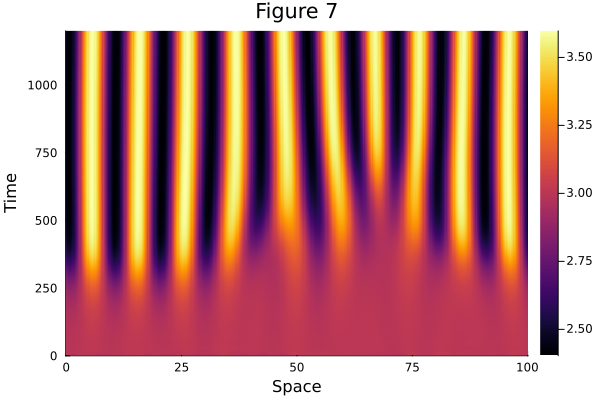

In [9]:
# display the pattern
heatmap(x, t, V7; xlabel="Space", ylabel="Time", title="Figure 7")

In [10]:
######## Waves - homogeneous stimulus - close to the threshold (FIG. 8) ########

ae = 41;     # excitatory strenght
ai = 40;     # inhibitory strenght
re = 0.001;    # excitatory range (m)
ri = 0.00037;     # inhibitory range (m)
r = re/ri;   # ratio

v_real = 0.3; # propagation velocity (m/s)
v = v_real / (re * sqrt(400*400))

L = L_real_waves / re
du = L/N; x = 0:du:L;

eta_e = 1.0
eta_i = r
eta = [eta_e eta_i]

# define time axis
T = 600 #adimensional time
t = 0:dt:T
N_t = length(t);

In [11]:
# main cycle - fig 8

# initialize V
V = zeros(N_t,(N+1)); # this are the true dimensions of the V matrix
V_perturb = V0.*ones(1,N+1) .+ 0.05 .*randn(1,N+1); # initial perturbation
V[1,:] = V_perturb

# initialize the external stimulation
muP0 = muP0_val*ones(size(V))

# compute the pattern
@time begin
V8,J8 = brainPatterns(V,eta,du,v,ae,ai,muP0,L,N_t);
end

number of total iterations: 12000
iteration #1000
iteration #2000
iteration #3000
iteration #4000
iteration #5000
iteration #6000
iteration #7000
iteration #8000
iteration #9000
iteration #10000
iteration #11000
iteration #12000
150.162706 seconds (82.08 M allocations: 270.453 GiB, 14.79% gc time, 1.27% compilation time)


([3.1061486907837494 2.971202594940905 … 3.02144848348809 2.9464730020340952; 3.1061486907837494 2.971202594940905 … 3.02144848348809 2.9464730020340952; … ; 4.106477602514763 4.085712840287032 … 4.1108535308614 4.114893654722489; 4.090307832487718 4.059515765597925 … 4.115087869164212 4.1088839681562], [0.442167170988224 0.5157268351952382 … 0.48827442109957175 0.5292211249305723; 0.4830720037373659 0.4775062937307091 … 0.49955730481216065 0.4659486551063132; … ; -2.3416951907469397 -2.705066006892366 … -1.589535040346739 -1.969107598433201; 0.0 0.0 … 0.0 0.0], [0.0 0.0 … 0.0 0.0; -0.008199075989776273 0.0022262120127166662 … -0.0016587031194259085 0.004137406144823852; … ; -0.3233954005409113 -0.5239414937821367 … 0.08468676605623124 -0.12019373132577099; -0.4884645001499054 -0.686086286762893 … -0.08380133910979884 -0.2873744208509784])

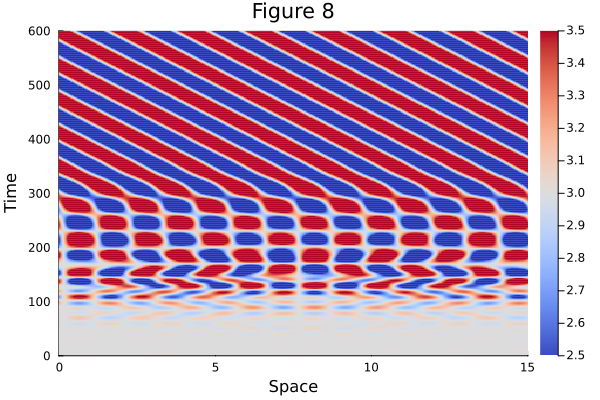

In [12]:
heatmap(x,t,V8; clim=(2.5,3.5), xlabel="Space", ylabel="Time", title="Figure 8", color=:coolwarm)


In [13]:
######## FIGURE 9 ########
# Waves - Homogeneous external stimulation - Well above threshold

re = 0.001;       # excitatory range (m)
ri = 0.0001;
ai = 100.;
ae = 101.;
r = re/ri;   # ratio

v_real = 0.3; # propagation velocity (m/s)
v = v_real / (re * sqrt(400*400))

L = L_real_waves / re
du = L/N; x = 0:du:L;

eta_e = 1.0
eta_i = r
eta = [eta_e eta_i]

# define time axis
T = 200
t = 0:dt:T
N_t = length(t);

In [14]:
# main cycle - fig 9

# initialize V
V = zeros(N_t,(N+1)); # this are the true dimensions of the V matrix
V_perturb = V0.*ones(1,N+1) .+ 0.05 .*randn(1,N+1); # initial perturbation
V[1,:] = V_perturb

# initialize the external stimulation
muP0 = muP0_val*ones(size(V))

# compute the pattern
@time begin
V9,J9 = brainPatterns(V,eta,du,v,ae,ai,muP0,L,N_t);
end

number of total iterations: 4000
iteration #1000
iteration #2000
iteration #3000
iteration #4000
 51.381337 seconds (26.67 M allocations: 88.951 GiB, 13.07% gc time)


([2.9998132114422815 2.9296487112464153 … 2.93590922754832 3.053579725957739; 2.9998132114422815 2.9296487112464153 … 2.93590922754832 3.053579725957739; … ; -0.014094532649573527 0.2879766417520253 … -0.5069044839822924 -0.2816936802193608; -0.1357896243241298 0.16826303038942497 … -0.576827788328826 -0.3859945549435032], [0.5012373016945375 0.9711716251712872 … 0.9293405549403673 0.14092160263320608; 0.5865398921790117 0.5365883028710243 … 0.17376797413399458 0.46852319991780433; … ; 19.203307673122783 18.116593213581623 … 20.89407650976281 20.045792011523428; 0.0 0.0 … 0.0 0.0], [0.0 0.0 … 0.0 0.0; 7.120451261279915e-5 0.027076145696243593 … 0.024671566369602372 -0.02063290616622664; … ; -2.4339018334911255 -2.3942722272520065 … -1.3984660869306722 -2.0860174944828476; -1.104641539853395 -1.138414175935326 … -0.06357042855034978 -0.7360414604474232])

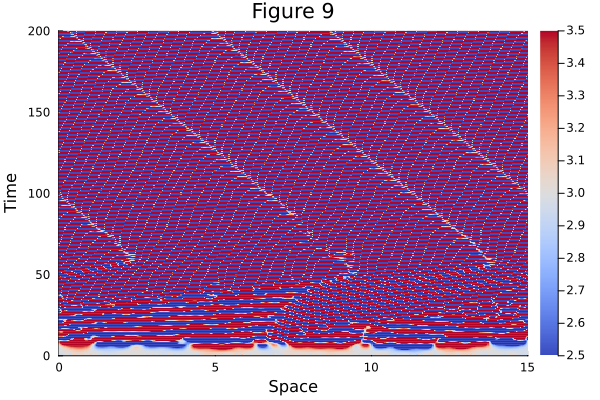

In [15]:
heatmap(x,t,V9; clim=(2.5,3.5), xlabel="Space", ylabel="Time", title="Figure 9", color=:coolwarm)

In [16]:
######## FIGURE 10 ########
# Waves - inhomogeneous stimulus - close to the threshold

ae = 41;     # excitatory strenght
ai = 40;     # inhibitory strenght
re = 0.001;    # excitatory range (m)
ri = 0.00037;     # inhibitory range (m)
r = re/ri;   # ratio

v_real = 0.3;# propagation velocity (m/s)
v = v_real / (re * sqrt(400*400))

L = L_real_waves / re;
du = L/N; x = 0:du:L;

eta_e = 1.0
eta_i = r
eta = [eta_e eta_i]

# define time axis
T = 200
t = 0:dt:T
N_t = length(t);

In [17]:
# main cycle - fig 10

# initialize V
V = zeros(N_t,(N+1)); # this are the true dimensions of the V matrix
V_perturb = V0.*ones(1,N+1) .+ 0.05 .*randn(1,N+1); # initial perturbation
V[1,:] = V_perturb

# initialize and define inhomogeneous external stimuli 
muP = muP0_val*ones(size(V))
x1 = Int64(round((0.475*L)/(du)))+1;
x2 = Int64(round((0.525*L)/(du)))+1;
for i = x1:x2
    muP[:,i] = muP[:,i] .+ 20;
end

# compute the pattern
@time begin
V10,J10 = brainPatterns(V,eta,du,v,ae,ai,muP,L,N_t);
end

number of total iterations: 4000
iteration #1000
iteration #2000
iteration #3000
iteration #4000
 46.738923 seconds (26.67 M allocations: 88.951 GiB, 13.35% gc time)


([2.9515852827923306 2.922778820918655 … 2.9788911223870684 3.1241779099809883; 2.9515852827923306 2.922778820918655 … 2.9788911223870684 3.1241779099809883; … ; 3.2391740421503 3.239674901251134 … 3.23909131279271 3.2389788608298207; 3.231526263292147 3.2322782015075853 … 3.23120559348007 3.231167451847528], [0.5264334609842081 0.5421228999605638 … 0.5115275245320134 0.432422504662501; 0.5032864121461387 0.5834216958939962 … 0.44101882670883796 0.46697062397769784; … ; 0.5218652215045054 0.5299570555114883 … 0.5131548507990935 0.5162424313972558; 0.0 0.0 … 0.0 0.0], [0.0 0.0 … 0.0 0.0; 0.003742408909593875 0.005967203952095446 … 0.0016318201072472505 -0.009587770265924368; … ; -0.152955577163064 -0.1479339948709801 … -0.15771438625280357 -0.15622817964585833; -0.14852546047904733 -0.1436264876708644 … -0.15323977072720404 -0.15174218315290072])

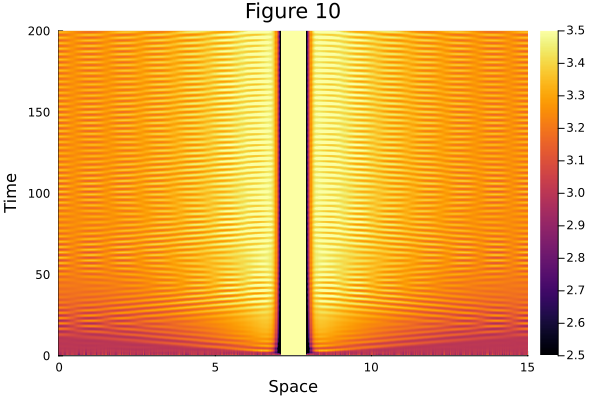

In [18]:
heatmap(x,t,V10; clim=(2.5,3.5),xlabel="Space", ylabel="Time", title="Figure 10")

In [19]:
######## FIGURE 11 ########
# Waves - Homogeneous external stimulation - Well above threshold
re = 0.001;       # excitatory range (m)
ri = 0.0001;
ai = 100.;
ae = 101.;
r = re/ri;   # ratio

v_real = 0.3; # propagation velocity (m/s)
v = v_real / (re * sqrt(400*400))

L = L_real_waves / re
du = L/N; x = 0:du:L;

eta_e = 1.0
eta_i = r
eta = [eta_e eta_i]

# define time axis
T = 200
t = 0:dt:T
N_t = length(t);

In [20]:
# main cycle - fig 11

# initialize V
V = zeros(N_t,(N+1)); # this are the true dimensions of the V matrix
V_perturb = V0.*ones(1,N+1) .+ 0.05 .*randn(1,N+1); # initial perturbation
V[1,:] = V_perturb

# initialize and define inhomogeneous external stimuli 
muP = muP0_val*ones(size(V))
x1 = Int64(round((0.475*L)/(du)))+1;
x2 = Int64(round((0.525*L)/(du)))+1;
t1 = Int64(49/dt)+1;
t2 = Int64(130/dt)+1;

for i = x1:x2
    muP[t1:t2,i] = muP[t1:t2,i] .+ 20;
end


@time begin
    V11,J11 = brainPatterns(V,eta,du,v,ae,ai,muP,L,N_t);
end

number of total iterations: 4000
iteration #1000
iteration #2000
iteration #3000
iteration #4000
 51.802915 seconds (26.67 M allocations: 88.951 GiB, 12.80% gc time)


([3.0480885937940667 3.0162916159736266 … 2.929020159672786 3.032973615549523; 3.0480885937940667 3.0162916159736266 … 2.929020159672786 3.032973615549523; … ; -1.9455586880816256 -1.8307713333579971 … -1.6918827308980517 -1.8974654127906874; -1.9254363481225123 -1.9295725821469212 … -1.445786410412118 -1.7621845073491071], [0.17767064668121435 0.3907282712448463 … 0.975369797912677 0.278904111395768; -0.07364527947936494 0.5139354611918847 … 0.3986860204262541 0.39535881743363177; … ; 30.038892871226466 26.440476724654292 … 36.8075185674 33.43937800547434; 0.0 0.0 … 0.0 0.0], [0.0 0.0 … 0.0 0.0; -0.018520897355642617 -0.0062781672364390145 … 0.027317481911994547 -0.012703475207687755; … ; 0.40244679918226733 -1.9760249757784811 … 4.921926409718671 2.7056181088316054; 2.086424697229445 -0.23986007530001863 … 6.4797038336617065 4.326898468861696])

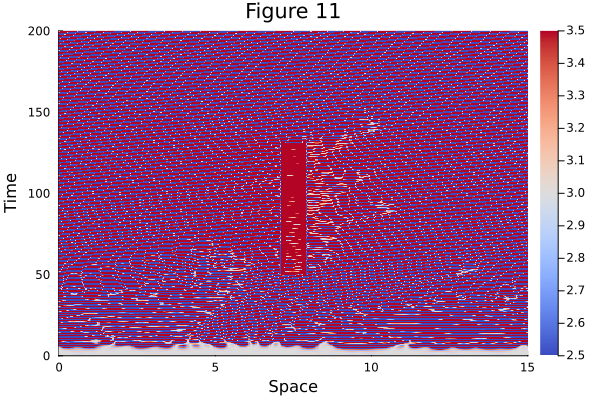

In [21]:
heatmap(x,t,V11; clim=(2.5,3.5), xlabel="Space", ylabel="Time",title="Figure 11", color=:coolwarm)